Celem projektu będzie problem segmentacji obrazu. Dane zostały udostępnione na portalu <a href="https://www.kaggle.com/datasets/faizalkarim/flood-area-segmentation"> Kaggle</a>. Zbiór danych zawiera obrazy obszarów dotkniętych powodzią i odpowiadające im obrazy masek przedstawiające obszar wodny.
 

Zaczniemy od wczytania części potrzebnych bibliotek.

In [11]:
import tensorflow as tf
import pandas as pd
import os
import glob
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from PIL import Image
from tqdm import tqdm
import imghdr
from tensorflow import keras
import numpy as np

In [12]:
image_dir = r"/kaggle/input/flood-area-segmentation/Image"
mask_dir = r"/kaggle/input/flood-area-segmentation/Mask"

Na podstawie załadowanego zbioru, stworzymy obiekt `DataFrame`, w którym będą zawierały się ścieżki do każdego z plików

In [13]:
image_files = sorted(glob.glob(os.path.join(image_dir, "*.jpg")))
mask_files = sorted(glob.glob(os.path.join(mask_dir, "*.png")))


paths = pd.DataFrame({
    "input": image_files,
    "target": mask_files
})
paths

,input,target
0,/kaggle/input/flood-area-segmentation/Image/0.jpg,/kaggle/input/flood-area-segmentation/Mask/0.png
1,/kaggle/input/flood-area-segmentation/Image/1.jpg,/kaggle/input/flood-area-segmentation/Mask/1.png
2,/kaggle/input/flood-area-segmentation/Image/10...,/kaggle/input/flood-area-segmentation/Mask/10.png
3,/kaggle/input/flood-area-segmentation/Image/10...,/kaggle/input/flood-area-segmentation/Mask/100...
4,/kaggle/input/flood-area-segmentation/Image/10...,/kaggle/input/flood-area-segmentation/Mask/100...
...,...,...
285,/kaggle/input/flood-area-segmentation/Image/5.jpg,/kaggle/input/flood-area-segmentation/Mask/5.png
286,/kaggle/input/flood-area-segmentation/Image/6.jpg,/kaggle/input/flood-area-segmentation/Mask/6.png
287,/kaggle/input/flood-area-segmentation/Image/7.jpg,/kaggle/input/flood-area-segmentation/Mask/7.png
288,/kaggle/input/flood-area-segmentation/Image/8.jpg,/kaggle/input/flood-area-segmentation/Mask/8.png


W kolumnie *input* zawarte są ścieżki do oryginalnych zdjęć, natomiast kolumna *target* zawiera ścieżki docelowych masek danych zdjęć. Należy zwrócić uwagę, że zdjęcia są rozszerzenia `.jpg` a maski `.png`. Będziemy musieli mieć to na uwadze przy dekodowaniu poszczególnych plików.  

Ze względu na doświadczenie, które zdobyłem przy wcześniejszej obróbce tego zbioru danych, okazuje się, że mimo, że każde zdjęcie docelowe (z kolumny *input*) ma rozszerzenie `.jpg` to pojawiały się problemy w dalszej etapie projektu. Mianowicie po dokładnym sprawdzeniu typów danych z użyciem funkcji `what()` z biblioteki `imghdr` dowiadujemy się, że niektóre pliki nie są ostatecznie typu `jpg`. Dowód poniżej:

In [14]:
from pathlib import Path
import imghdr

image_extensions = [".png", ".jpg"]
img_type_accepted_by_tf = ["bmp", "gif", "jpeg", "png"]
rows_to_delete = []

for index, row in paths.iterrows():
    filepath = Path(row['input'])
    if filepath.suffix.lower() in image_extensions:
        img_type = imghdr.what(filepath)
        if img_type is None:
            print(f"{filepath} is not an image")
            rows_to_delete.append(index)
        elif img_type not in img_type_accepted_by_tf:
            print(f"{filepath} is a {img_type}, not accepted by TensorFlow")
            rows_to_delete.append(index)

/kaggle/input/flood-area-segmentation/Image/1002.jpg is a webp, not accepted by TensorFlow
/kaggle/input/flood-area-segmentation/Image/1009.jpg is a webp, not accepted by TensorFlow
/kaggle/input/flood-area-segmentation/Image/1013.jpg is a webp, not accepted by TensorFlow
/kaggle/input/flood-area-segmentation/Image/1015.jpg is a webp, not accepted by TensorFlow
/kaggle/input/flood-area-segmentation/Image/1027.jpg is a webp, not accepted by TensorFlow
/kaggle/input/flood-area-segmentation/Image/1028.jpg is a webp, not accepted by TensorFlow
/kaggle/input/flood-area-segmentation/Image/1036.jpg is a webp, not accepted by TensorFlow
/kaggle/input/flood-area-segmentation/Image/1037.jpg is a webp, not accepted by TensorFlow
/kaggle/input/flood-area-segmentation/Image/1046.jpg is a webp, not accepted by TensorFlow
/kaggle/input/flood-area-segmentation/Image/1049.jpg is a webp, not accepted by TensorFlow
/kaggle/input/flood-area-segmentation/Image/1053.jpg is not an image
/kaggle/input/flood-a

Nie wiem z czego wynika ten błąd, natomiast powodowałby on problemy w dalszej analizie. Dlatego decydujemy się na usunięcie tych zdjęć docelowych oraz odpowiadających im masek. Liczba obserwacji, które nam zostają: 

In [15]:
paths = paths.drop(rows_to_delete).reset_index()
len(paths)

233

Definiujemy funkcję do wizualizacji zdjęć docelowych.

In [16]:
def plot_image_from_df(df, index):
    image_path = df.loc[index, 'input']

    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)

    plt.imshow(image)
    plt.axis('off')
    plt.show()

Pierwsze zdjęcie:

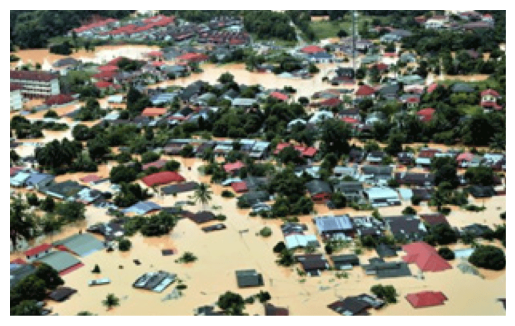

In [17]:
plot_image_from_df(paths, 0)

Definiujemy funkcję do wyświetlania masek.

In [18]:
def plot_mask_from_df(df, index):
    image_path = df.loc[index, 'target']

    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=1)

    plt.imshow(image)
    plt.axis('off') 
    plt.show()

Maska pierwszego zdjęcia:

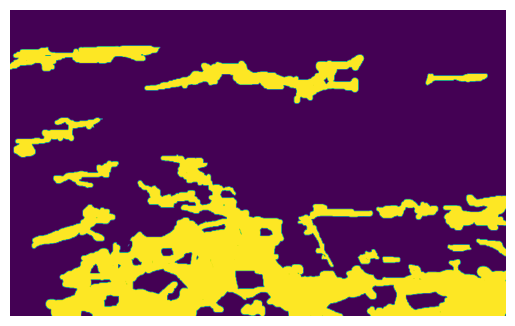

In [19]:
plot_mask_from_df(paths, 0)

Kolejnym etapem będzie implementacja funkcji służącej do wczytania, dekodowania oraz normalizacji zdjęć. Zdjęcia docelowe wczytujemy z użyciem funkcji `decode_jpeg()` wczytując wszystkie trzy kanały. Masko natomiast wczytujemy funkcją `decode_png()` wczytując jeden kanał. Ustawaimy wymiary zdjęć na 256x256. Pliki ostatecznie kodujemy jako format *tf.float32*.

In [20]:
def read_image_and_mask(file_path, is_mask = False):

    try:
        image = tf.io.read_file(file_path)
        if is_mask:
            image = tf.image.decode_png(image, channels=1)
        else:
            image = tf.image.decode_jpeg(image, channels=3)
        
        image = tf.image.resize(image, [256, 256])
        image = tf.image.convert_image_dtype(image, tf.float32)
        
    except tf.errors.InvalidArgumentError as e:
        tf.print(f"Error reading file: {file_path}")
        raise e

    return image/255

Definiujemy funkcję, której zadaniem będzie stworzenie obiektu *TF Dataset* na podstawie ramki danych zawierającej ścieżki do zdjeć oraz odpowiadających im masek.
<br> Do wczytania pojedynczych zdjęć używamy wcześniej zdefiniowanej funkcji `read_image_and_mask()`. Charakterystyka zbioru:
<ul>
    <li>dataset.cache - pozwoli uniknąć wykonywania niektórych operacji (takich jak otwieranie plików i odczytywanie danych) podczas każdej epoki.</li>
    <li>dataset.shuffle - pomaga zapobiegać stronniczości podczas treningu, zapewnia losowość w wyborze partii (ang. <i>batch</i>) i zapobiega uczeniu się przez model wzorców opartych na kolejności danych</li>
    <li>dataset.batch() - rozmiar partii.</li>
 </ul>

In [21]:
def create_dataset_from_dataframe(dataframe):

    dataset = tf.data.Dataset.from_tensor_slices((dataframe['input'], dataframe['target']))
    dataset = dataset.map(lambda x, y: (read_image_and_mask(x, is_mask=False), read_image_and_mask(y, is_mask=True)), num_parallel_calls=tf.data.experimental.AUTOTUNE)

    dataset = dataset.cache()
    dataset = dataset.shuffle(buffer_size=len(dataframe)) 
    dataset = dataset.batch(16)

    return dataset

Rozdzielamy zbiór *paths* zawierający ścieżki plików na zbiory treningowy, walidacyjny oraz testowy. Podziału dokonujemy w proprocji 70%:15%:15% na rzecz zbioru treningowego.

In [22]:
train_df, remaining_df = train_test_split(paths, test_size=0.3, random_state=42)
val_df, test_df = train_test_split(remaining_df, test_size=0.5, random_state=42)

train_dataset = create_dataset_from_dataframe(train_df)
val_dataset = create_dataset_from_dataframe(val_df)
test_dataset = create_dataset_from_dataframe(test_df)

Funkcja `display()` będzie wyświetlała oryginalny obraz, oryginalną maskę oraz maskę przewidywaną przez model.

In [23]:
def display(display_list):
  plt.figure(figsize=(15, 15))

  title = ['Obraz wejściowy', 'Oryginalna Maska', 'Przewidywana Maska']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
    plt.axis('off')
  plt.show()

Wyświetlamy pięć pierwszych obrazów oraz odpowiadające im maski ze zbioru treningowego.

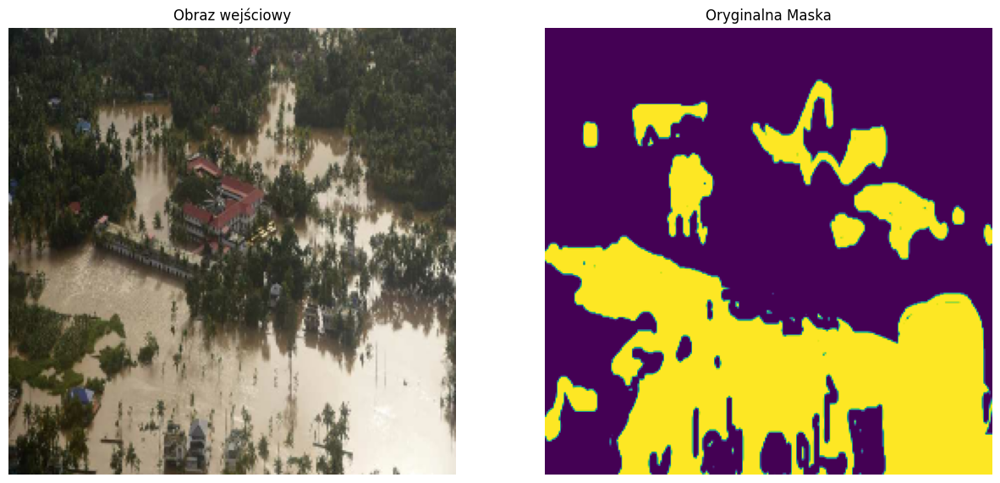

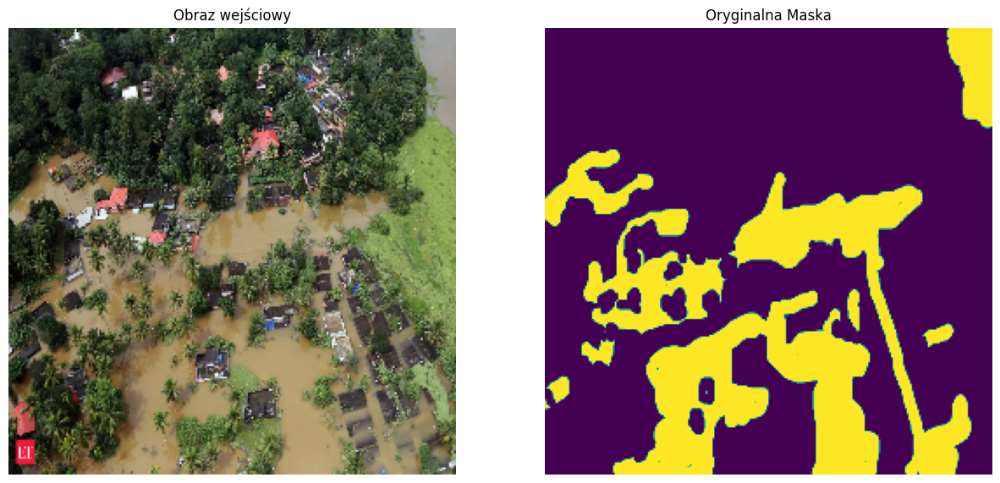

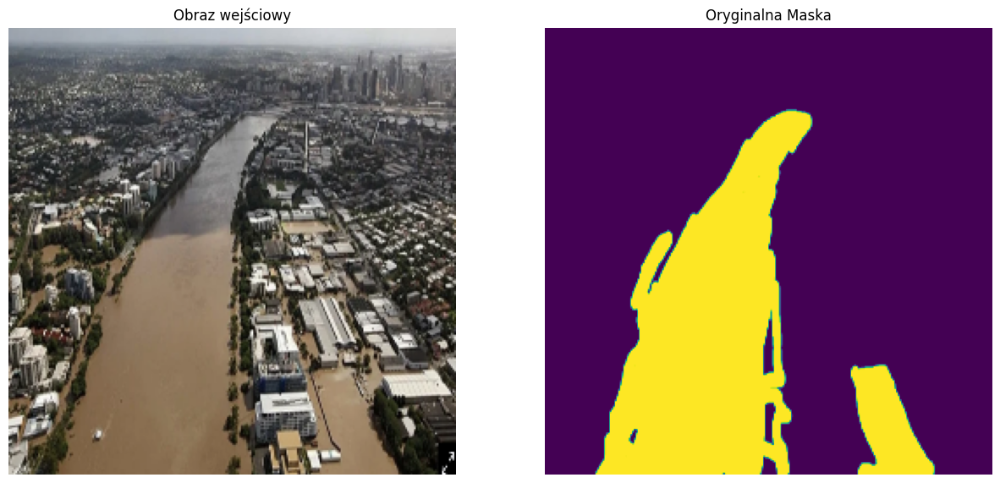

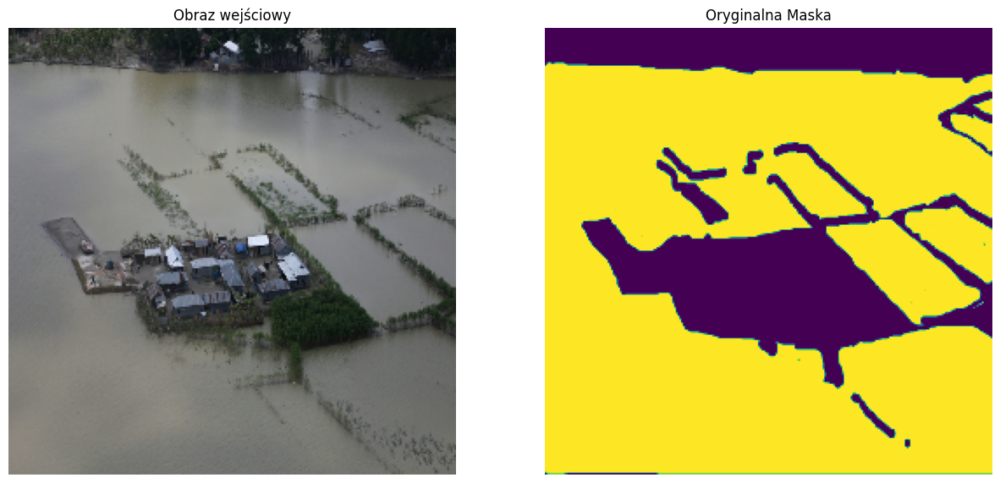

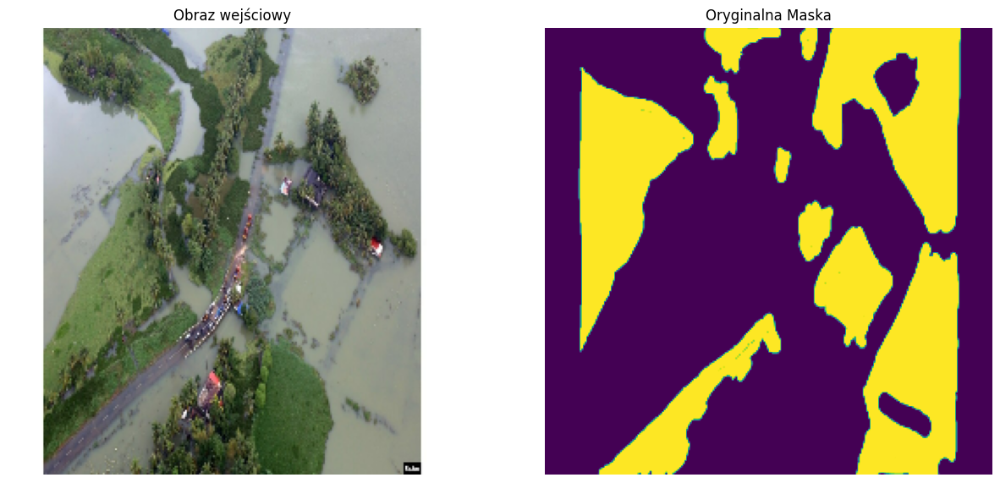

In [24]:
for images, masks in train_dataset.take(5):
    sample_image, sample_mask = images[0], masks[0]
    display([sample_image, sample_mask])

Pora na stworzenie modelu. Posłużymy się "kerasową" biblioteką`segmentation_models` (<a href="https://segmentation-models.readthedocs.io/en/latest/tutorial.html">tutaj</a> dokumentacja), która to zapewnia zaimplementowane podstawowe architektury sieci neuronowych stworzonych do problemu segmentacji obrazów. Najpierw przystąpimy do zainstalowania tej biblioteki.

In [25]:
!pip install segmentation_models

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 3.1 MB/s eta 0:00:00


In [26]:
os.environ["SM_FRAMEWORK"] = "tf.keras" # żeby wszytać bibliotekę segmentation_models

Użyjemy legendarnej architektury jaką jest *U-Net* (więcej o niej <a href="https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/">tutaj</a>), która została stworzona do segmentacjo obrazów medycznych. Jako *backbone'a*, czyli warstwy konwolucyjne służącej do ekstrakcji cech (ang *feature extraction*), użyjemy sieci *efficientnetb2*; ze względu na charakterystykę maski, gdzie rozróżniamy jedynie obszary pod wodą, a resztę rozumiemy jako tło, ustawimy parametr `classes = 1`, przez co najlepszą funkcją aktywacji będzie funkcja sigmoidalna. Wagi warstwy konwolucyjnej zostały wytrenowane na zbiorze *ImageNet*.
<br> Architektura sieci *U-Net*:
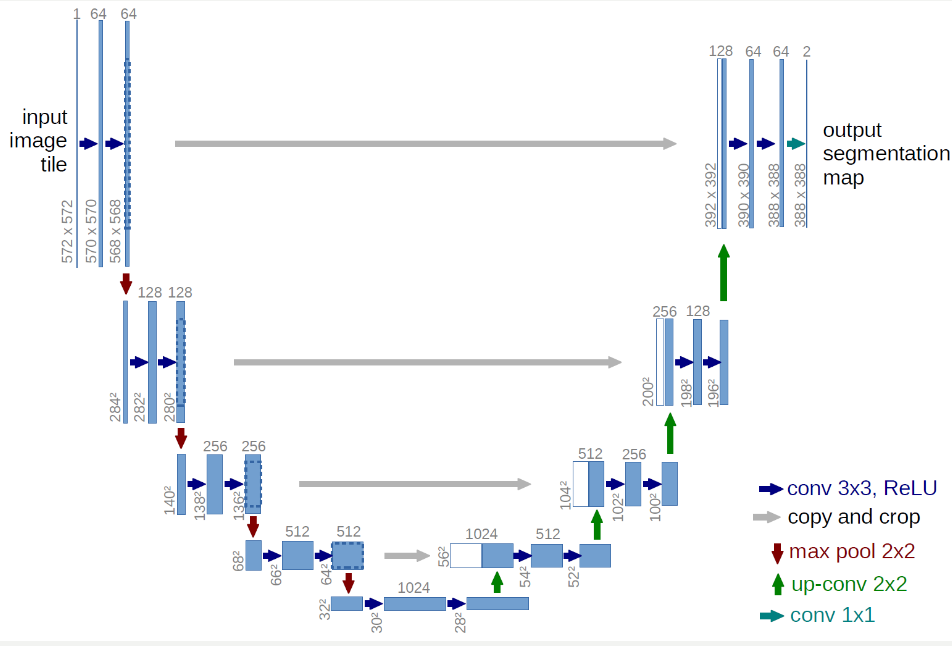

In [27]:
import segmentation_models as sm
from segmentation_models.metrics import iou_score

model = sm.Unet('efficientnetb2', 
                input_shape = (256,256,3), 
                classes = 1, 
                activation='sigmoid', 
                encoder_weights='imagenet')

Segmentation Models: using `tf.keras` framework.
31936256/31936256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Funkcję straty będziemy optymalizować za pomocą algorytmy *Adam* (ang. *Adaptive Moment Estimation*) - algorytm dynamicznie dostosowuje współczynnik uczenia (ang. *learning rate*) dla każdego indywidualnego parametru w modelu, zamiast używać pojedynczej, globalnej wartości przez cały proces optymalizacji. Funkcją kosztu jest *Binary Cross-entropy*, która  mierzy różnice w zawartości informacji między rzeczywistą a przewidywaną maską obrazu. Jako metrykę charakteryzującą jakość dopasowania przewidywanej maski będzie *Intersection over Union score*, która stosunek nakładających się na siebie dwóch masek - przewidywanej oraz teoretycznej. Im wyższa wartość tej metryki, tym model lepiej przewiduje maskę oryginalną.
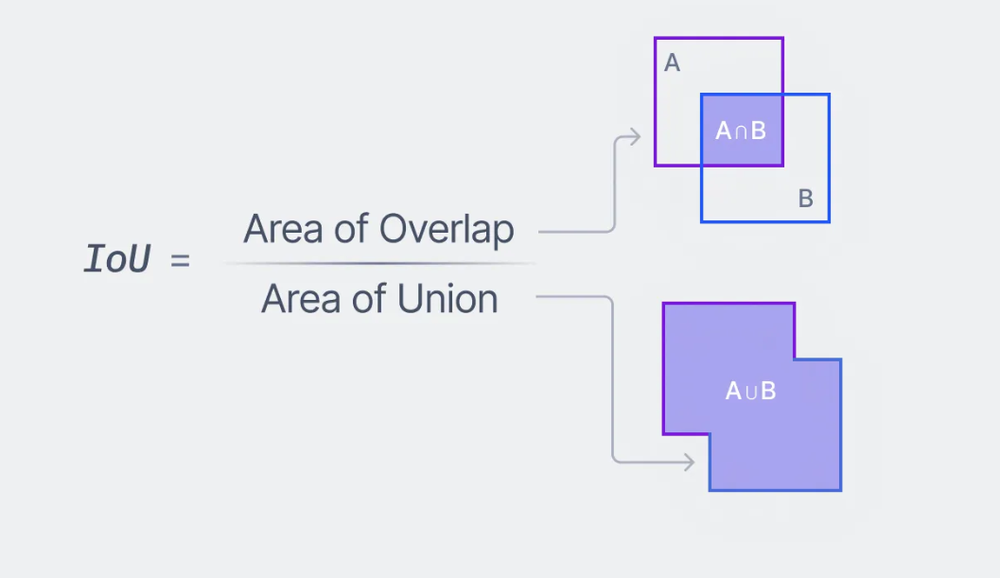

In [28]:
model.compile(
    optimizer = keras.optimizers.Adam(learning_rate = 2e-5),
    loss = keras.losses.BinaryCrossentropy(),
    metrics = [iou_score],
)

Model będziemy trenowali przez 50 epok. Ze względu na małą liczbę obserwacji jako wartość parametru `validation_data` podamy nasz zbiór testowy. Będzie to potrzebne do wykreślenia krzywych uczenia.

In [29]:
history = model.fit(train_dataset, validation_data = val_dataset, 
                    epochs = 50)

Epoch 1/50


I0000 00:00:1729540887.763332     103 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


11/11 ━━━━━━━━━━━━━━━━━━━━ 259s 10s/step - iou_score: 0.2471 - loss: 0.6927 - val_iou_score: 0.0073 - val_loss: 2.0472
Epoch 2/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 174ms/step - iou_score: 0.2738 - loss: 0.6602 - val_iou_score: 0.0167 - val_loss: 1.6914
Epoch 3/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 177ms/step - iou_score: 0.2943 - loss: 0.5879 - val_iou_score: 0.0350 - val_loss: 1.3766
Epoch 4/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 176ms/step - iou_score: 0.3280 - loss: 0.5527 - val_iou_score: 0.0783 - val_loss: 1.0660
Epoch 5/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 177ms/step - iou_score: 0.3530 - loss: 0.4996 - val_iou_score: 0.1578 - val_loss: 0.8007
Epoch 6/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 177ms/step - iou_score: 0.3829 - loss: 0.4738 - val_iou_score: 0.2204 - val_loss: 0.6232
Epoch 7/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 176ms/step - iou_score: 0.4080 - loss: 0.4436 - val_iou_score: 0.2964 - val_loss: 0.5223
Epoch 8/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 174ms/step - iou_score: 0.4256 - loss: 0.4307 - val_iou_scor

In [30]:
#model.summary() struktura modelu

Poniżej obserwujemy krzywe uczenia:

/tmp/ipykernel_35/4201870302.py:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


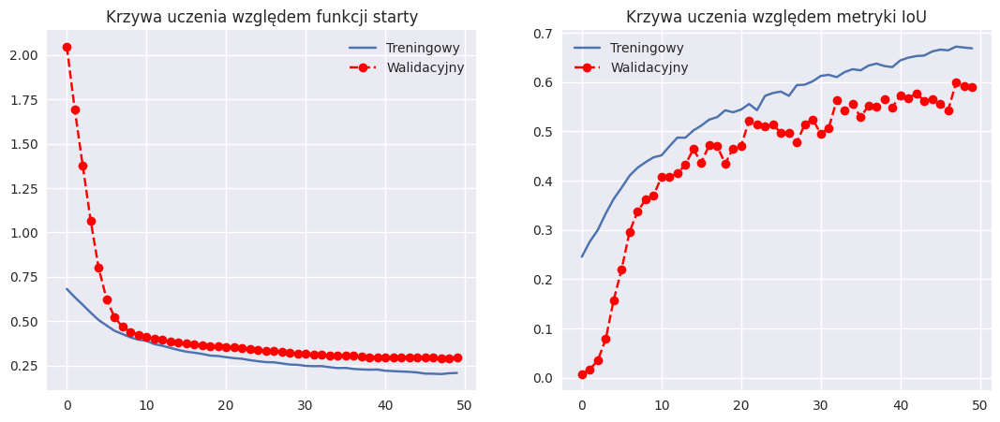

In [44]:
plt.style.use('seaborn')

plt.figure(figsize = (13,5))
plt.subplot(1,2,1)
plt.title('Krzywa uczenia względem funkcji starty')
plt.plot(history.history['loss'], label = 'Treningowy')
plt.plot(history.history['val_loss'], '--r', marker = 'o', label = 'Walidacyjny')
plt.legend()

plt.subplot(1,2,2)
plt.title('Krzywa uczenia względem metryki IoU')
plt.plot(history.history['iou_score'], label = 'Treningowy')
plt.plot(history.history['val_iou_score'], '--r', marker = 'o', label = 'Walidacyjny')
plt.legend()
plt.show()

Zauważamy tendencje do nadmiernego dopasowania do danych treningowych, co nie powinno dziwić przy tak małym zbiorze danych. Kolejnym podejściem do tego problemu, który zastosujemy będzie augmentacja danych treningowych w celu uniknięcia niekorzystengo zjawsika *overfitingu*.

Poniżej mamy ewaluację oceny modelu na zbiorze testowym.

In [32]:
model.evaluate(test_dataset)

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - iou_score: 0.5899 - loss: 0.3313


[0.3490581810474396, 0.566819965839386]

Wartość IoU na poziomie ~0.60 świadczy o średnim dopasowaniu modelu. 

Definiujemy funkcję, której użyjemy do wizualizowania predykcji modelu.

In [33]:
def plot_predictions(model, dataset, num_samples):
    count = 0

    for images, masks in dataset.take(num_samples):
        for i in range(len(images)):
            if count >= num_samples:
                break
            
            sample_image, sample_mask = images[i], masks[i]
            prediction = model.predict(tf.expand_dims(sample_image, axis=0))[0]

            display([sample_image, sample_mask, prediction])

            count += 1
        if count >= num_samples:
            break

Przykładowe predykcje:

1/1 ━━━━━━━━━━━━━━━━━━━━ 12s 12s/step


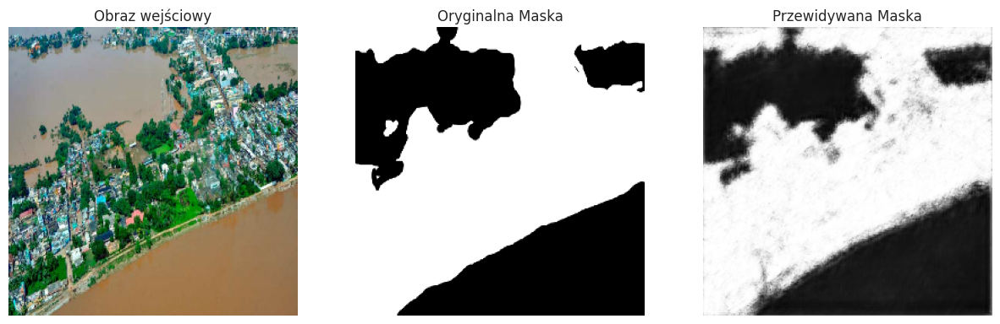

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


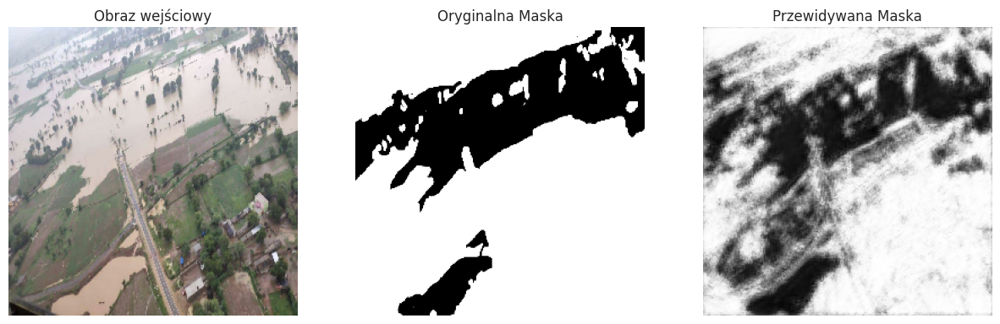

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


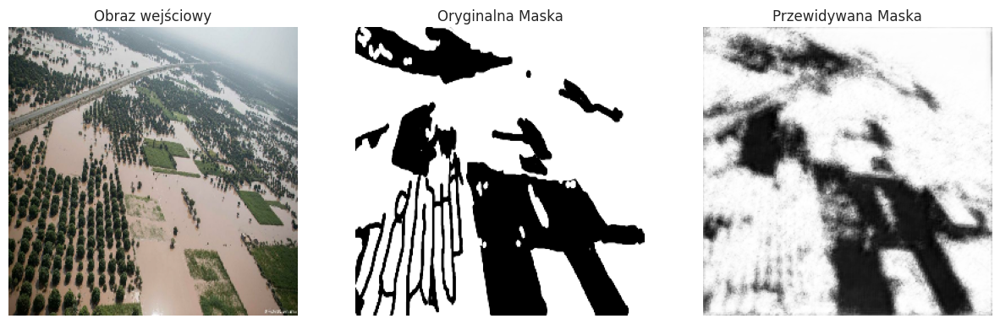

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


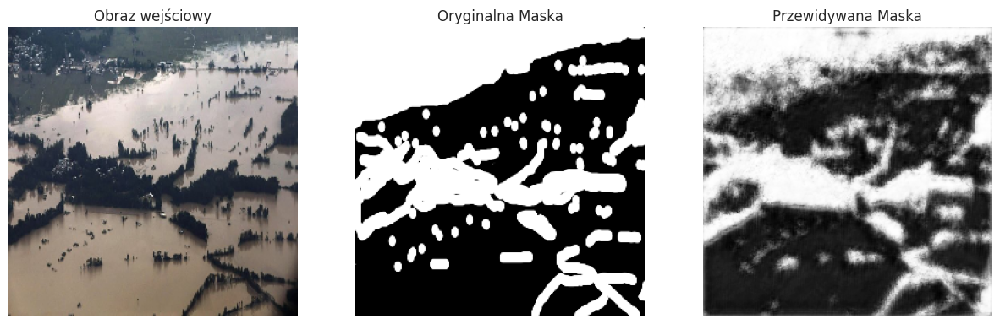

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


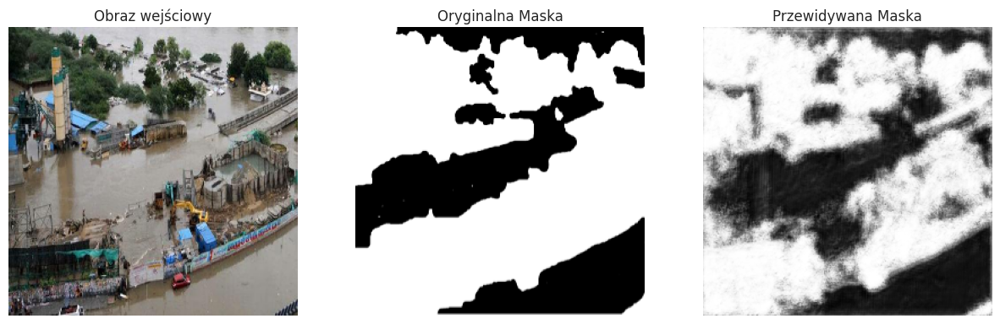

In [34]:
plot_predictions(model, test_dataset, 5)

Jak widzimy jest potencjał do poprawy.
<br> W tym celu implementujemy klasę `Augment`, która będzie reprezentowała transformowane dane treningowe. Technika augmentacji generuje losowe obrazy w oparciu o istniejące dane treningowe w celu poprawy zdolności generalizowania modeli. Kolejno transformacje, które zastosujemy na oryginalnych zdjęciach oraz maskach:
<ul>
    <li>tf.keras.layers.RandomFlip - losowo odwraca obrazy w poziomie.</li>
    <li>tf.keras.layers.RandomRotation - losowa obraza obrazy. Wartość parametru <i>fraction</i> odpowiada o jaki procent wartośći liczby 2&pi; obraz może być zrotowany</li>
    <li>tf.keras.layers.RandomZoom - losowe zbliżenie bądź oddalenie obrazu. W przypadku zdefiniowanej klasy wysokość oraz szerokość mogą być zbliżone/oddalone o 20%</li>
    <li>tf.keras.layers.RandomContrast - losowo dostosowuje kontrast obrazów. U nas kontrast możę być zróźnicowany o 20%</li>

In [35]:
class Augment(tf.keras.layers.Layer):
    def __init__(self, seed=42):
        super().__init__()

        self.augment_inputs = tf.keras.Sequential([
            tf.keras.layers.RandomFlip(mode="horizontal", seed=seed),
            tf.keras.layers.RandomRotation(factor=0.2, seed=seed),
            tf.keras.layers.RandomZoom(height_factor=0.2, width_factor=0.2, seed=seed),
            tf.keras.layers.RandomContrast(factor=0.2, seed=seed)
        ])
        

        self.augment_labels = tf.keras.Sequential([
            tf.keras.layers.RandomFlip(mode="horizontal", seed=seed),
            tf.keras.layers.RandomRotation(factor=0.2, seed=seed),
            tf.keras.layers.RandomZoom(height_factor=0.2, width_factor=0.2, seed=seed),
            tf.keras.layers.RandomContrast(factor=0.2, seed=seed)
        ])

    def call(self, inputs, labels):
        inputs = self.augment_inputs(inputs)
        labels = self.augment_labels(labels)
        return inputs, labels

Mapujemy tak zdefiniowaną klasę względem zbioru treningowego.

In [36]:
augmented_train_dataset = train_dataset.map(Augment())

Przykładowe przeksztalcone obrazy oraz odpowiadające maski:

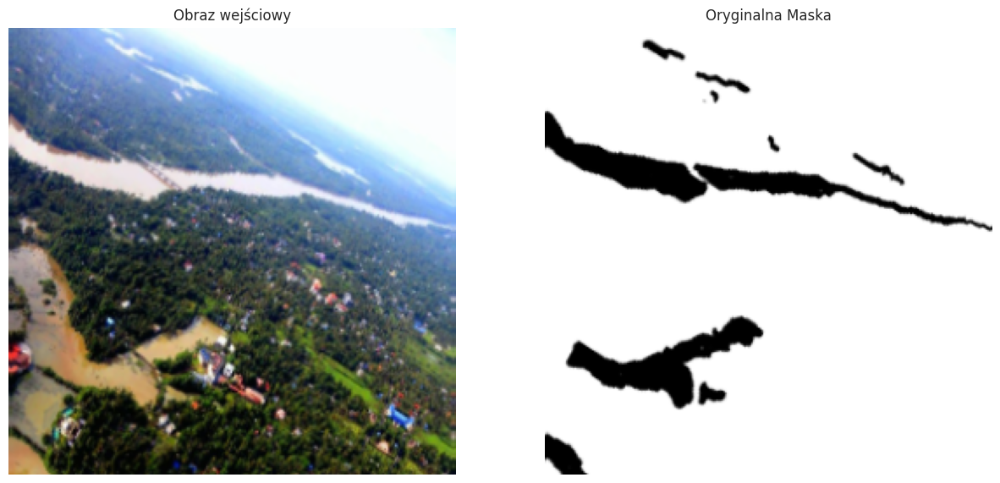

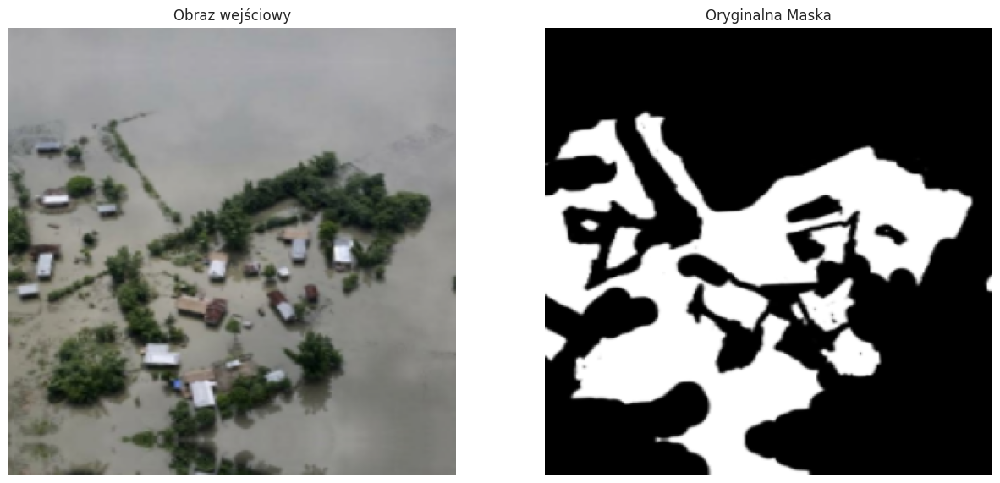

In [37]:
for images, masks in augmented_train_dataset.take(2):
  sample_image, sample_mask = images[0], masks[0]
  display([sample_image, sample_mask])

Definjemy nowy model o takich samych parametrach jak pierwotny model.

In [45]:
model_augmentation = sm.Unet('efficientnetb2', 
                input_shape = (256,256,3), 
                classes = 1, 
                activation='sigmoid', 
                encoder_weights='imagenet')

In [46]:
model_augmentation.compile(
    optimizer = keras.optimizers.Adam(learning_rate = 2e-5),
    loss = keras.losses.BinaryCrossentropy(),
    metrics = [iou_score],
)

Nowy model trenujemy na transformowanym zbiorze treningowym. Dodatkowo zwiększamy liczbę epok treningowych do stu.

In [47]:
history_augmented = model_augmentation.fit(augmented_train_dataset, validation_data=val_dataset,  
                    epochs = 100)

Epoch 1/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 201s 7s/step - iou_score: 0.3203 - loss: 0.7165 - val_iou_score: 0.2731 - val_loss: 0.7438
Epoch 2/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 253ms/step - iou_score: 0.3486 - loss: 0.6660 - val_iou_score: 0.2839 - val_loss: 0.7204
Epoch 3/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 251ms/step - iou_score: 0.3747 - loss: 0.6254 - val_iou_score: 0.2580 - val_loss: 0.7027
Epoch 4/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 243ms/step - iou_score: 0.3803 - loss: 0.6034 - val_iou_score: 0.2449 - val_loss: 0.6901
Epoch 5/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 243ms/step - iou_score: 0.4030 - loss: 0.5671 - val_iou_score: 0.2691 - val_loss: 0.6815
Epoch 6/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 252ms/step - iou_score: 0.4078 - loss: 0.5533 - val_iou_score: 0.2748 - val_loss: 0.6725
Epoch 7/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 249ms/step - iou_score: 0.4379 - loss: 0.5172 - val_iou_score: 0.2644 - val_loss: 0.6598
Epoch 8/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 243ms/step - iou_score: 0.4518 - loss: 0.4

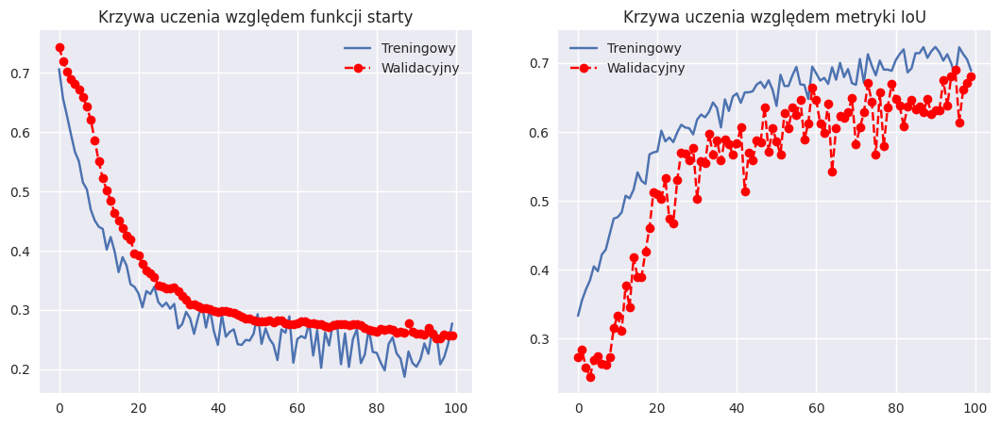

In [48]:
#plt.style.use('seaborn')

plt.figure(figsize = (13,5))
plt.subplot(1,2,1)
plt.title('Krzywa uczenia względem funkcji starty')
plt.plot(history_augmented.history['loss'], label = 'Treningowy')
plt.plot(history_augmented.history['val_loss'], '--r', marker = 'o', label = 'Walidacyjny')
plt.legend()
plt.subplot(1,2,2)
plt.title('Krzywa uczenia względem metryki IoU')
plt.plot(history_augmented.history['iou_score'], label = 'Treningowy')
plt.plot(history_augmented.history['val_iou_score'], '--r', marker = 'o', label = 'Walidacyjny')
plt.legend()
plt.show()

Jakość dopasowania modelu na zbiorze testowym, zbudowanego w oparciu o powiększony zbiór treningowy:

In [49]:
model_augmentation.evaluate(test_dataset)

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - iou_score: 0.6483 - loss: 0.3541


[0.353117436170578, 0.65055251121521]

Po augmentacji danych treningowych oraz zwiększeniu liczby epok nowy model osiąga średnio o ~5% korzystniejsze wartości funkcji celu oraz metryki jakości dopasowania.

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


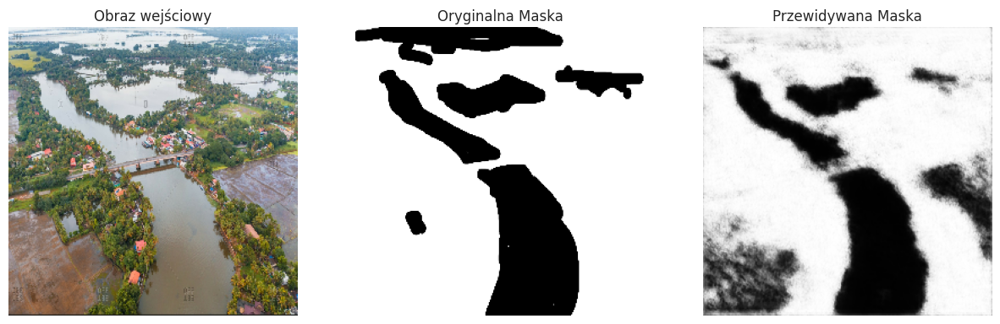

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


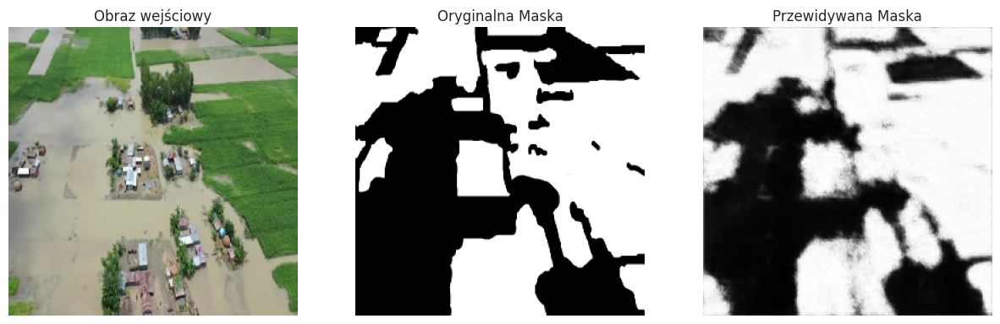

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


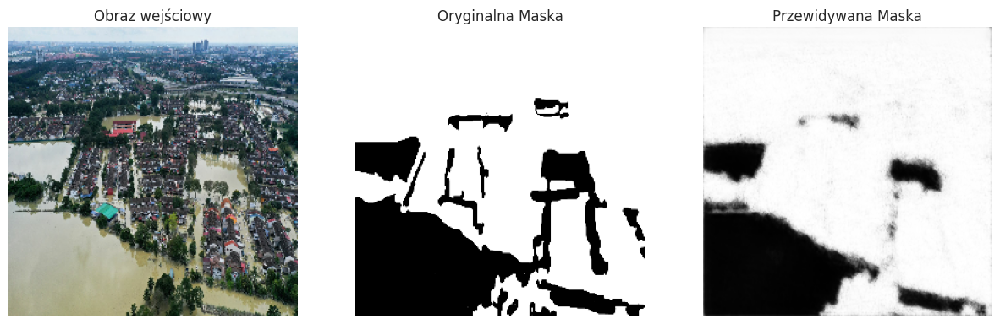

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


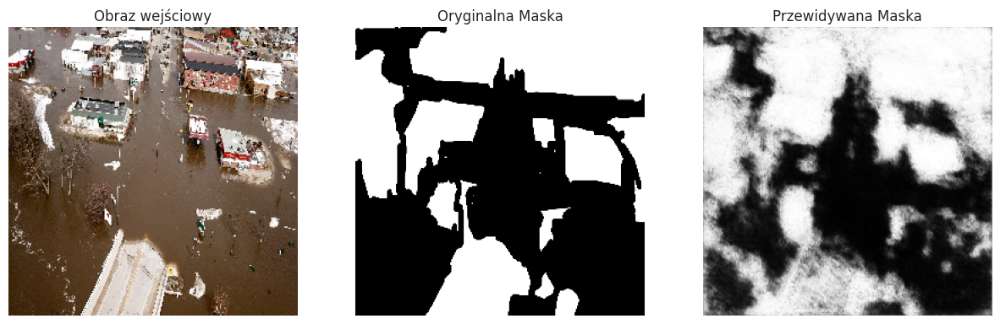

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


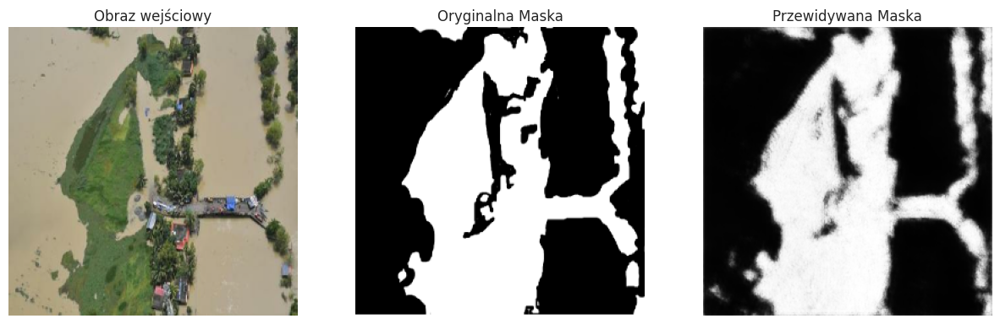

In [50]:
plot_predictions(model_augmentation, test_dataset, 5)